Sources:
- https://www.kaggle.com/code/klyushnik/san-francisco-crimes-catboostclassifier
- https://www.kaggle.com/code/jaichaudhrani/crime-jai
- https://scottmduda.medium.com/san-francisco-crime-classification-9d5a1c4d7cfd

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

In [17]:
train = pd.read_csv('../data/train.csv')

/var/folders/41/nzwfwwtn3kb7y13s4d_whpv00000gn/T/ipykernel_66351/349983387.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x='Category', data=train, palette='Paired', ax=ax, color = 'red')


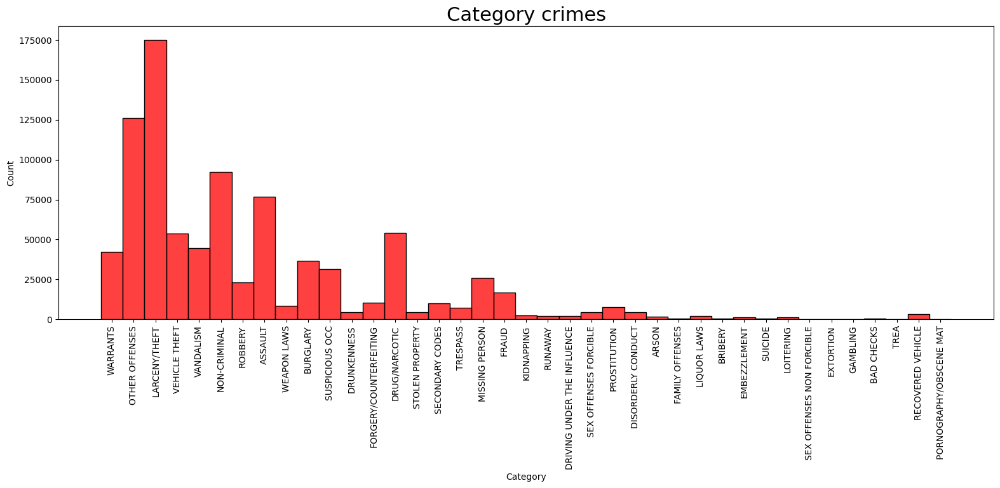

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(19, 6))
sns.histplot(x='Category', data=train, palette='Paired', ax=ax, color = 'red')
ax.tick_params(axis='x', rotation=90)
plt.title("Category crimes", fontsize=22)
plt.show()

/var/folders/41/nzwfwwtn3kb7y13s4d_whpv00000gn/T/ipykernel_65959/2920408962.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x='PdDistrict', data=train, palette='Paired', ax=ax, color = 'red')


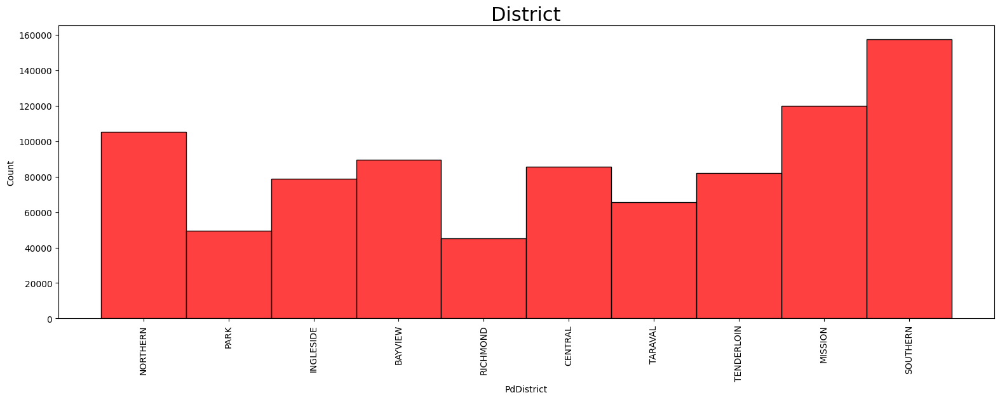

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(19, 6))
sns.histplot(x='PdDistrict', data=train, palette='Paired', ax=ax, color = 'red')
ax.tick_params(axis='x', rotation=90)
plt.title("District", fontsize=22)
plt.show()

/var/folders/41/nzwfwwtn3kb7y13s4d_whpv00000gn/T/ipykernel_65959/112685019.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x='Resolution', data=train, palette='Paired', ax=ax, color = 'red')


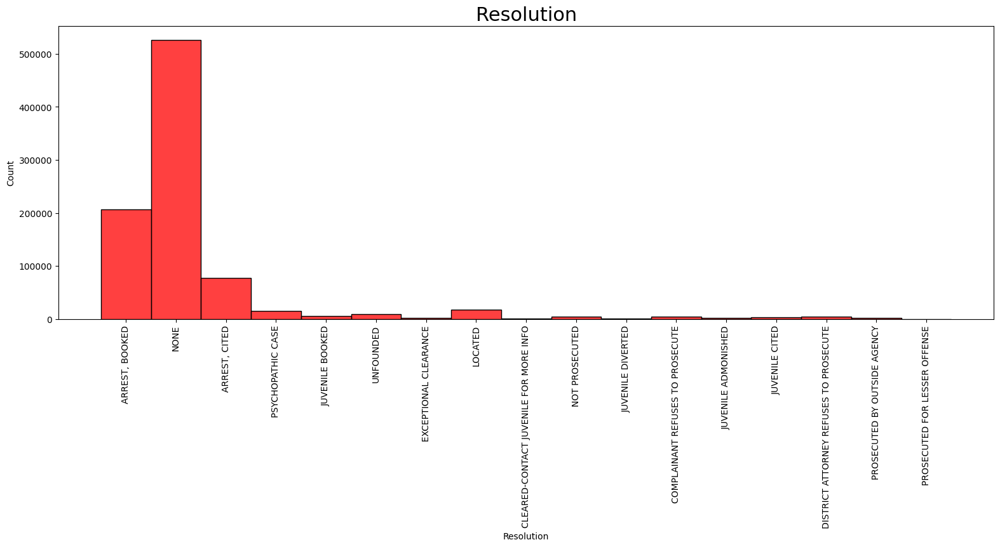

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(19, 6))
sns.histplot(x='Resolution', data=train, palette='Paired', ax=ax, color = 'red')
ax.tick_params(axis='x', rotation=90)
plt.title("Resolution", fontsize=22)
plt.show()

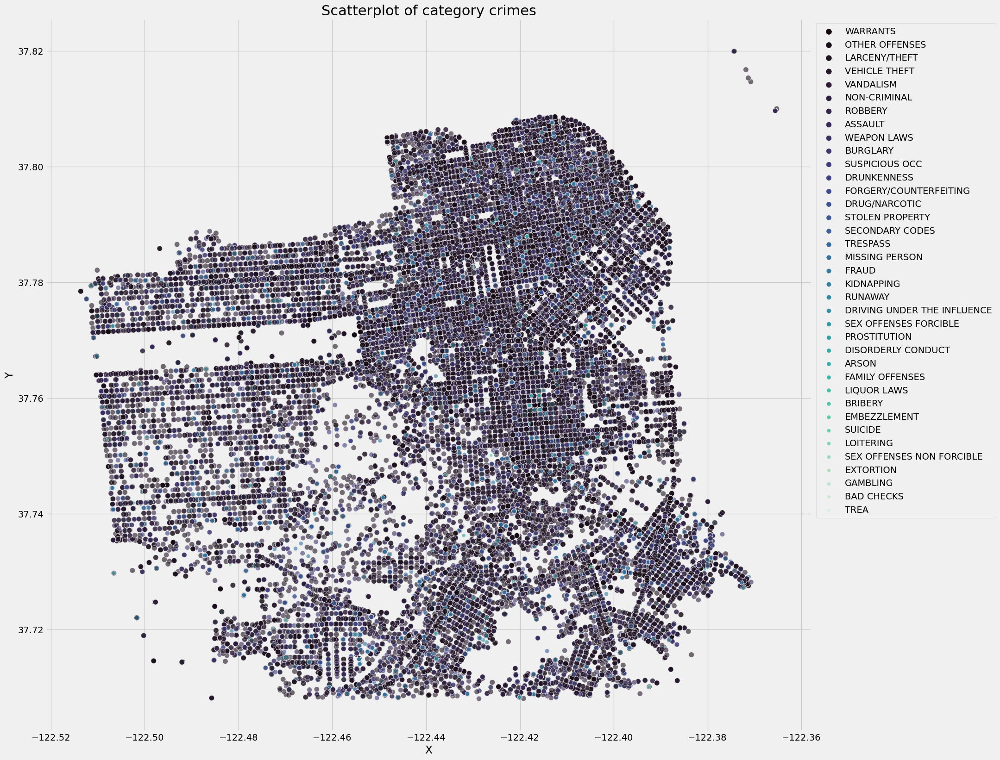

In [ ]:
with plt.style.context('fivethirtyeight'):
    fig, ax = plt.subplots(1, 1, figsize=(19, 19))
    sns.scatterplot(data=train.iloc[:100_000], x='X', y='Y', alpha=0.6, palette='mako', hue='Category', size='Category')
    plt.title("Scatterplot of category crimes", fontsize=22)
    plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left')

In [ ]:
print('Missing values train',train.isnull().sum(), sep='')

Missing values trainDates         0
Category      0
Descript      0
DayOfWeek     0
PdDistrict    0
Resolution    0
Address       0
X             0
Y             0
dtype: int64


In [ ]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [ ]:
test_features = ['Descript', 'DayOfWeek', 'PdDistrict', 'Resolution', 'Address']
for feature in test_features:
    train[feature] = train[feature].map(lambda x: x.lower())

In [ ]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,warrant arrest,wednesday,northern,"arrest, booked",oak st / laguna st,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,traffic violation arrest,wednesday,northern,"arrest, booked",oak st / laguna st,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,traffic violation arrest,wednesday,northern,"arrest, booked",vanness av / greenwich st,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,grand theft from locked auto,wednesday,northern,none,1500 block of lombard st,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,grand theft from locked auto,wednesday,park,none,100 block of broderick st,-122.438738,37.771541


In [ ]:
train['Dates'] = pd.to_datetime(train['Dates'])

train['year'] = train['Dates'].dt.year
train['month'] = train['Dates'].dt.month
train['day_of_month'] = train['Dates'].dt.day
train['day_of_week'] = train['Dates'].dt.day_of_week
train['hour'] = train['Dates'].dt.hour
# train.drop(['Dates', 'DayOfWeek'], axis = 1, inplace = True)
train.head(3)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,year,month,day_of_month,day_of_week,hour
0,2015-05-13 23:53:00,WARRANTS,warrant arrest,wednesday,northern,"arrest, booked",oak st / laguna st,-122.425892,37.774599,2015,5,13,2,23
1,2015-05-13 23:53:00,OTHER OFFENSES,traffic violation arrest,wednesday,northern,"arrest, booked",oak st / laguna st,-122.425892,37.774599,2015,5,13,2,23
2,2015-05-13 23:33:00,OTHER OFFENSES,traffic violation arrest,wednesday,northern,"arrest, booked",vanness av / greenwich st,-122.424363,37.800414,2015,5,13,2,23


In [6]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
enc.fit(train[['PdDistrict', 'Address']])
train[['PdDistrict', 'Address']] = enc.transform(train[['PdDistrict', 'Address']])
train.head()

KeyError: "None of [Index(['PdDistrict', 'Address'], dtype='object')] are in the [columns]"

In [ ]:
X = train[['PdDistrict','Address', 'X', 'Y', 'year', 'month', 'day_of_month', 'day_of_week', 'hour']]
y = train['Category']
X.head()

,PdDistrict,Address,X,Y,year,month,day_of_month,day_of_week,hour
0,4.0,19790.0,-122.425892,37.774599,2015,5,13,2,23
1,4.0,19790.0,-122.425892,37.774599,2015,5,13,2,23
2,4.0,22697.0,-122.424363,37.800414,2015,5,13,2,23
3,4.0,4266.0,-122.426995,37.800873,2015,5,13,2,23
4,5.0,1843.0,-122.438738,37.771541,2015,5,13,2,23


In [31]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [32]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(iterations=20,
                           learning_rate=0.5,
                           depth=4,
                           loss_function='MultiClass',
                           random_seed=63)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)

0:	learn: 3.0633535	total: 832ms	remaining: 15.8s
1:	learn: 2.8262950	total: 1.29s	remaining: 11.6s
2:	learn: 6.1565052	total: 1.68s	remaining: 9.54s
3:	learn: 6.2361590	total: 2.05s	remaining: 8.21s
4:	learn: 33.7305061	total: 2.38s	remaining: 7.14s
5:	learn: 27.6205239	total: 2.72s	remaining: 6.34s
6:	learn: 37.2135587	total: 3.08s	remaining: 5.71s
7:	learn: 35.6648156	total: 3.45s	remaining: 5.18s
8:	learn: 34.7115074	total: 3.77s	remaining: 4.61s
9:	learn: 35.7033722	total: 4.09s	remaining: 4.09s
10:	learn: 35.6376476	total: 4.55s	remaining: 3.72s
11:	learn: 32.8509592	total: 4.9s	remaining: 3.27s
12:	learn: 31.7767182	total: 5.23s	remaining: 2.82s
13:	learn: 29.7373187	total: 5.6s	remaining: 2.4s
14:	learn: 29.6693077	total: 5.94s	remaining: 1.98s
15:	learn: 29.5975620	total: 6.28s	remaining: 1.57s
16:	learn: 29.5875428	total: 6.62s	remaining: 1.17s
17:	learn: 29.5081524	total: 6.93s	remaining: 771ms
18:	learn: 29.4467129	total: 7.25s	remaining: 382ms
19:	learn: 29.2815855	total: 

In [33]:
np.argmax(y_pred, axis=1)

array([16, 16, 16, ..., 16, 16, 36])

In [34]:
np.unique(y_test)

array(['ARSON', 'ASSAULT', 'BAD CHECKS', 'BRIBERY', 'BURGLARY',
       'DISORDERLY CONDUCT', 'DRIVING UNDER THE INFLUENCE',
       'DRUG/NARCOTIC', 'DRUNKENNESS', 'EMBEZZLEMENT', 'EXTORTION',
       'FAMILY OFFENSES', 'FORGERY/COUNTERFEITING', 'FRAUD', 'GAMBLING',
       'KIDNAPPING', 'LARCENY/THEFT', 'LIQUOR LAWS', 'LOITERING',
       'MISSING PERSON', 'NON-CRIMINAL', 'OTHER OFFENSES',
       'PORNOGRAPHY/OBSCENE MAT', 'PROSTITUTION', 'RECOVERED VEHICLE',
       'ROBBERY', 'RUNAWAY', 'SECONDARY CODES', 'SEX OFFENSES FORCIBLE',
       'SEX OFFENSES NON FORCIBLE', 'STOLEN PROPERTY', 'SUICIDE',
       'SUSPICIOUS OCC', 'TREA', 'TRESPASS', 'VANDALISM', 'VEHICLE THEFT',
       'WARRANTS', 'WEAPON LAWS'], dtype=object)

In [35]:
model.score(X_test, y_test)

0.22686250892989643

In [36]:
train

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,year,month,day_of_month,day_of_week,hour
0,2015-05-13 23:53:00,WARRANTS,warrant arrest,wednesday,4.0,"arrest, booked",19790.0,-122.425892,37.774599,2015,5,13,2,23
1,2015-05-13 23:53:00,OTHER OFFENSES,traffic violation arrest,wednesday,4.0,"arrest, booked",19790.0,-122.425892,37.774599,2015,5,13,2,23
2,2015-05-13 23:33:00,OTHER OFFENSES,traffic violation arrest,wednesday,4.0,"arrest, booked",22697.0,-122.424363,37.800414,2015,5,13,2,23
3,2015-05-13 23:30:00,LARCENY/THEFT,grand theft from locked auto,wednesday,4.0,none,4266.0,-122.426995,37.800873,2015,5,13,2,23
4,2015-05-13 23:30:00,LARCENY/THEFT,grand theft from locked auto,wednesday,5.0,none,1843.0,-122.438738,37.771541,2015,5,13,2,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
878044,2003-01-06 00:15:00,ROBBERY,robbery on the street with a gun,monday,8.0,none,15816.0,-122.459033,37.714056,2003,1,6,0,0
878045,2003-01-06 00:01:00,LARCENY/THEFT,grand theft from locked auto,monday,2.0,none,11491.0,-122.447364,37.731948,2003,1,6,0,0
878046,2003-01-06 00:01:00,LARCENY/THEFT,grand theft from locked auto,monday,7.0,none,11315.0,-122.403390,37.780266,2003,1,6,0,0
878047,2003-01-06 00:01:00,VANDALISM,"malicious mischief, vandalism of vehicles",monday,7.0,none,22308.0,-122.390531,37.780607,2003,1,6,0,0


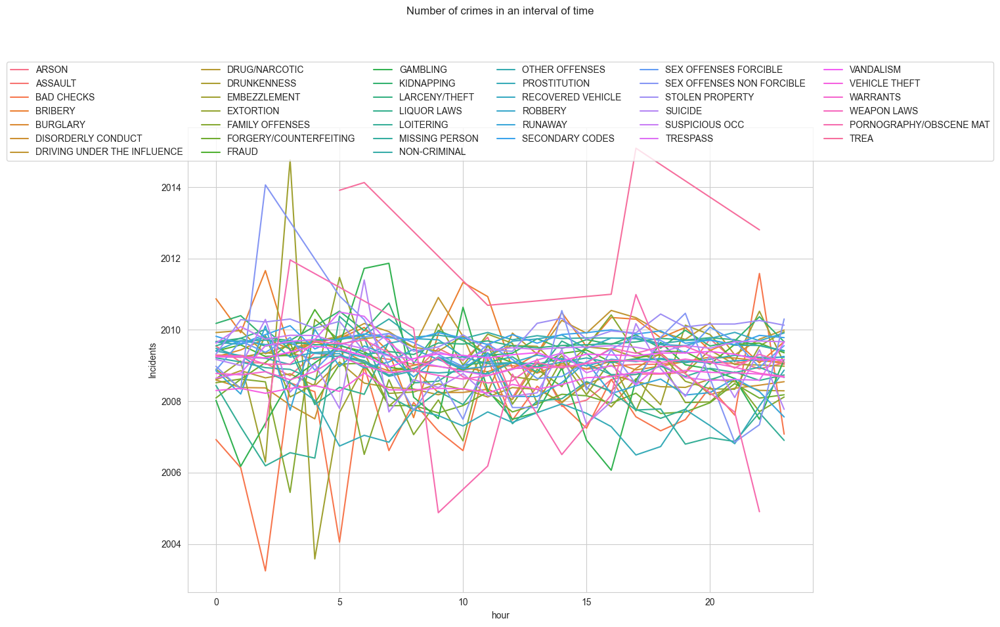

In [37]:
# Let's see how many crimes in different categories occur in different periods of time:
data = train.groupby(['hour', 'Dates', 'Category'],
                     as_index=False).count().iloc[:, :4]
data.rename(columns={'Dates': 'Inсidents'}, inplace=True)
data = data.groupby(['hour', 'Category'], as_index=False).mean()


sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.lineplot(x='hour', y='Inсidents', data=data, hue='Category')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=6)
plt.suptitle('Number of crimes in an interval of time')
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [38]:
df_train = pd.read_csv('../data/train.csv', parse_dates=['Dates'])
print(f"first date covert: {df_train.Dates.sort_values().min()}")
print(f"last date: {df_train.Dates.sort_values().max()}")
df_train.shape

first date covert: 2003-01-06 00:01:00
last date: 2015-05-13 23:53:00


(878049, 9)

In [39]:
df_train.describe().T

,count,mean,min,25%,50%,75%,max,std
Dates,878049,2009-03-16 08:25:41.991847168,2003-01-06 00:01:00,2006-01-11 03:00:00,2009-03-07 16:00:00,2012-06-11 10:13:00,2015-05-13 23:53:00,NaN
X,878049.0,-122.422616,-122.513642,-122.432952,-122.41642,-122.406959,-120.5,0.030354
Y,878049.0,37.77102,37.707879,37.752427,37.775421,37.784369,90.0,0.456893


/opt/homebrew/lib/python3.11/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/var/folders/41/nzwfwwtn3kb7y13s4d_whpv00000gn/T/ipykernel_65959/1978732669.py:15: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


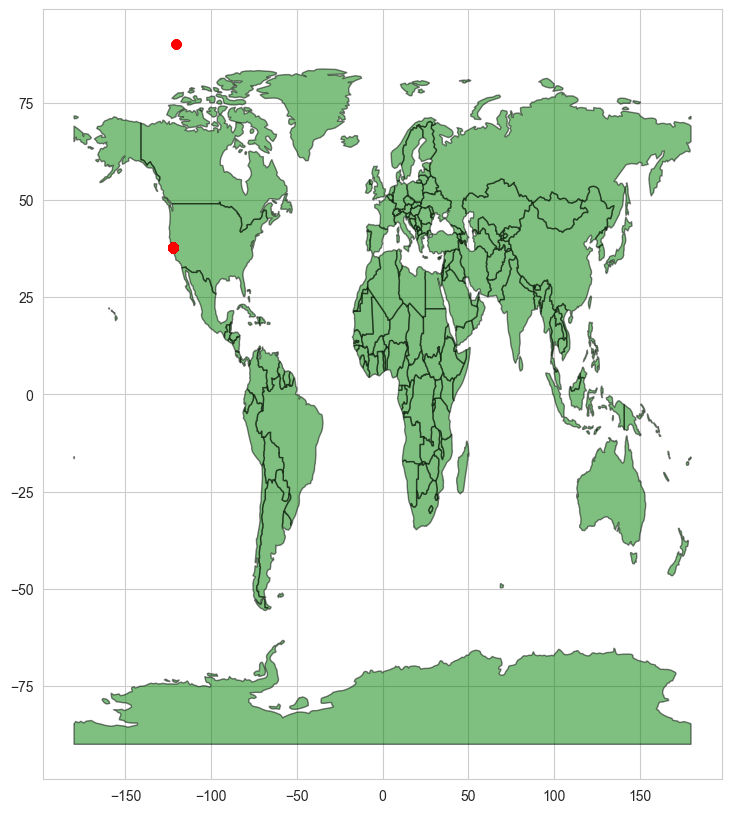

In [40]:
# Mark the points on the map (by latitude and longitude from the data) where exactly the crimes were committed:
import geopandas as gpd
from shapely.geometry import  Point

def create_gdf(df):
    gdf = df.copy()
    gdf['Coordinates'] = list(zip(gdf.X, gdf.Y))
    gdf.Coordinates = gdf.Coordinates.apply(Point)
    gdf = gpd.GeoDataFrame(
        gdf, geometry='Coordinates', crs={'init': 'epsg:4326'})
    return gdf

train_gdf = create_gdf(df_train)

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world.plot(figsize=(14,10), color='green', edgecolor='black', alpha=0.5)

train_gdf.plot(ax=ax, color='red')
plt.show()

"All coordinates from the dataset are grouped into two red dots on the map. The lower group of points is located in the San Francisco area, and the upper group of points does not fall on land on the map, it seems that this is some kind of extra or incorrect data. Let's see how many points got there (we see that the points lie above the longitude of 50.0):All coordinates from the dataset are grouped into two red dots on the map. The lower group of points is located in the San Francisco area, and the upper group of points does not fall on land on the map, it seems that this is some kind of extra or incorrect data. Let's see how many points got there (we see that the points lie above the longitude of 50.0):"

"There are 67 such points in the train, and there are even more of them in the test - 76 positions, all these outliers have the same coordinates x=-120.5, y=90.0. Longitude -120.5 corresponds to the longitude of the city of San Francisco, and latitude 90.0 is somewhere at the North Pole, which confirms the idea of erroneous data in the coordinates.There are 67 such points in the train, and there are even more of them in the test - 76 positions, all these outliers have the same coordinates x=-120.5, y=90.0. Longitude -120.5 corresponds to the longitude of the city of San Francisco, and latitude 90.0 is somewhere at the North Pole, which confirms the idea of erroneous data in the coordinates."

In [41]:
print(train_gdf.loc[train_gdf.Y > 50].count()[0])
train_gdf.loc[train_gdf.Y > 50].sample(5)

67


,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Coordinates
675288,2005-10-18 10:15:00,SUSPICIOUS OCC,SUSPICIOUS OCCURRENCE,Tuesday,CENTRAL,NONE,MONTGOMERY ST / THE EMBARCADERONORTH ST,-120.5,90.0,POINT (-120.50000 90.00000)
675540,2005-10-17 18:20:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,BAYVIEW,NONE,FITCH ST / DONNER AV,-120.5,90.0,POINT (-120.50000 90.00000)
687519,2005-08-13 17:00:00,VEHICLE THEFT,STOLEN AUTOMOBILE,Saturday,TENDERLOIN,NONE,JENNINGS CT / INGALLS ST,-120.5,90.0,POINT (-120.50000 90.00000)
678539,2005-10-03 18:46:00,OTHER OFFENSES,VIOLATION OF MUNICIPAL POLICE CODE,Monday,TENDERLOIN,"ARREST, CITED",7THSTNORTH ST / MCALLISTER ST,-120.5,90.0,POINT (-120.50000 90.00000)
798834,2004-01-24 14:00:00,LARCENY/THEFT,GRAND THEFT PICKPOCKET,Saturday,CENTRAL,NONE,GREENWICH ST / THE EMBARCADERO NORTH ST,-120.5,90.0,POINT (-120.50000 90.00000)


In [42]:
# Are there any duplicates in our training set?

df_train.duplicated().sum()

2323

In [43]:
# Remove duplicates and lines with erroneous coordinates:

df_train.drop_duplicates(inplace=True)
df_train = df_train.drop(df_train[(df_train.Y > 50)].index)
df_train.shape

(875659, 9)

In [44]:
# Sort data from a common file with a specific area and address
train_gdf.loc[(train_gdf.PdDistrict == 'TENDERLOIN') & (train_gdf.Address == '7THSTNORTH ST / MCALLISTER ST')]

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Coordinates
677036,2005-10-07 08:35:00,NON-CRIMINAL,FOUND PROPERTY,Friday,TENDERLOIN,UNFOUNDED,7THSTNORTH ST / MCALLISTER ST,-120.5,90.0,POINT (-120.50000 90.00000)
678539,2005-10-03 18:46:00,OTHER OFFENSES,VIOLATION OF MUNICIPAL POLICE CODE,Monday,TENDERLOIN,"ARREST, CITED",7THSTNORTH ST / MCALLISTER ST,-120.5,90.0,POINT (-120.50000 90.00000)
678540,2005-10-03 18:46:00,NON-CRIMINAL,PROPERTY FOR IDENTIFICATION,Monday,TENDERLOIN,"ARREST, CITED",7THSTNORTH ST / MCALLISTER ST,-120.5,90.0,POINT (-120.50000 90.00000)


In [45]:
# Sort data from a file in 67 lines by specific areas and addresses

train_gdf.loc[(train_gdf.Y > 50)].sort_values(['PdDistrict','Address']).sample(5)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Coordinates
772431,2004-05-28 18:00:00,VEHICLE THEFT,"VEHICLE, RECOVERED, OTHER VEHICLE",Friday,SOUTHERN,NONE,BRYANT ST / SPEAR ST,-120.5,90.0,POINT (-120.50000 90.00000)
678326,2005-10-04 09:00:00,LARCENY/THEFT,GRAND THEFT OF PROPERTY,Tuesday,INGLESIDE,NONE,PERSIA AV / LAGRANDE AV,-120.5,90.0,POINT (-120.50000 90.00000)
675070,2005-10-18 20:00:00,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,PARK,NONE,TURK ST / STJOSEPHS AV,-120.5,90.0,POINT (-120.50000 90.00000)
857248,2003-04-14 16:30:00,ROBBERY,"ROBBERY ON THE STREET, STRONGARM",Monday,BAYVIEW,COMPLAINANT REFUSES TO PROSECUTE,GILMAN AV / FITCH ST,-120.5,90.0,POINT (-120.50000 90.00000)
688950,2005-08-09 23:15:00,OTHER OFFENSES,"DRIVERS LICENSE, SUSPENDED OR REVOKED",Tuesday,TARAVAL,"ARREST, CITED",GENEVA AV / INTERSTATE280 HY,-120.5,90.0,POINT (-120.50000 90.00000)


In [46]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 875659 entries, 0 to 878048
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Dates       875659 non-null  datetime64[ns]
 1   Category    875659 non-null  object        
 2   Descript    875659 non-null  object        
 3   DayOfWeek   875659 non-null  object        
 4   PdDistrict  875659 non-null  object        
 5   Resolution  875659 non-null  object        
 6   Address     875659 non-null  object        
 7   X           875659 non-null  float64       
 8   Y           875659 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(6)
memory usage: 66.8+ MB


In [47]:
# Let's see how many crimes per day were committed in San Francisco:

df_train['Date'] = df_train.Dates.dt.date   # I select the date column from the data
#(initially I had to transfer the data from this column from object to datetime64)
data = df_train.groupby('Date').count().iloc[:, 0]
data.describe()

count    2249.000000
mean      389.354824
std        48.506406
min         2.000000
25%       360.000000
50%       389.000000
75%       420.000000
max       650.000000
Name: Dates, dtype: float64

/var/folders/41/nzwfwwtn3kb7y13s4d_whpv00000gn/T/ipykernel_65959/48001137.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, shade=True, color='g')


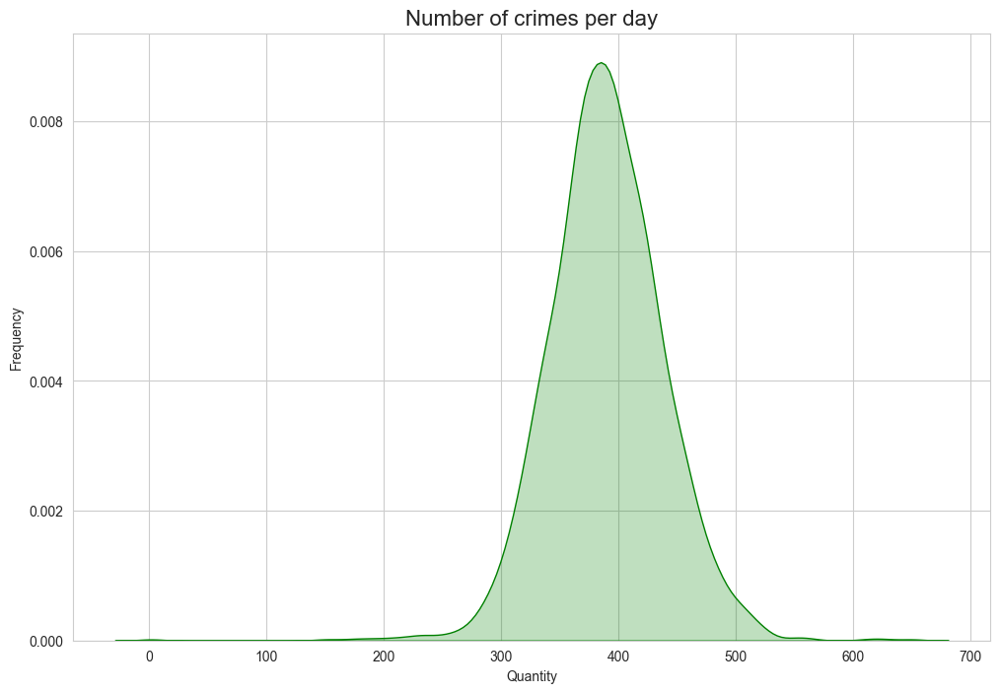

In [48]:
# On the graph we see the normal distribution:

col = sns.color_palette()

plt.figure(figsize=(12, 8))
sns.kdeplot(data=data, shade=True, color='g')

plt.title('Number of crimes per day', fontdict={'fontsize': 16})
plt.xlabel('Quantity')
plt.ylabel('Frequency')

plt.show()

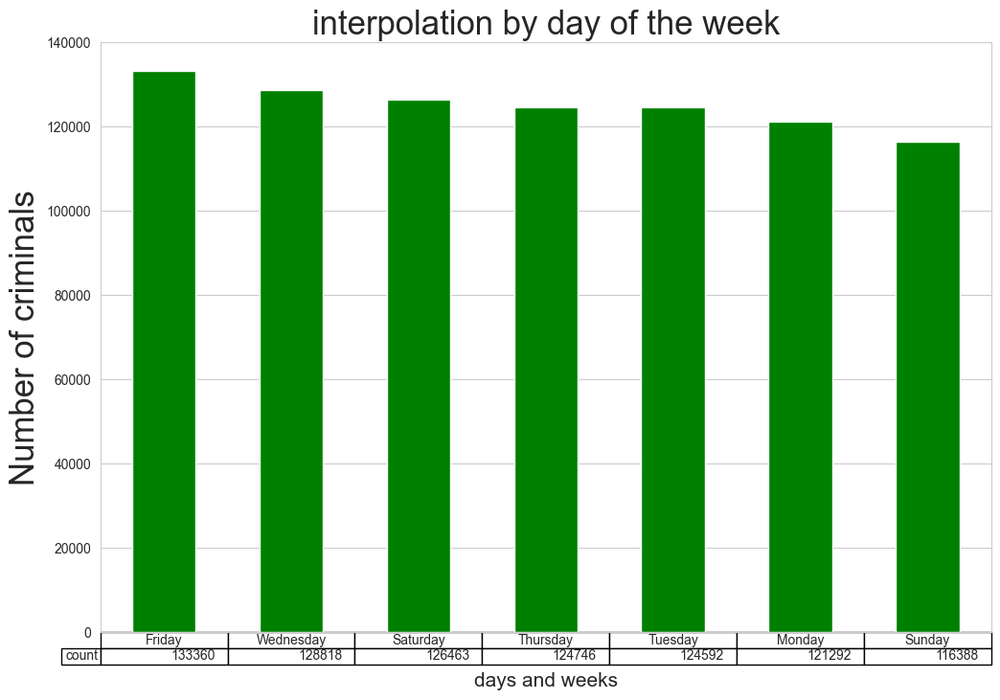

count         7.000000
mean     125094.142857
std        5395.860155
min      116388.000000
25%      122942.000000
50%      124746.000000
75%      127640.500000
max      133360.000000
Name: count, dtype: float64

In [49]:
# Let's group the data by days of the week and see how they look on the chart:

week = df_train['DayOfWeek'].value_counts()
week.plot(kind="bar",figsize=(12,8), table=True,  color='g')

plt.xticks([])
plt.xlabel('days and weeks',fontsize=15,labelpad=30)
plt.ylabel('Number of criminals',fontsize=25)
plt.title('interpolation by day of the week',fontsize=25)
plt.show()

week.describe()

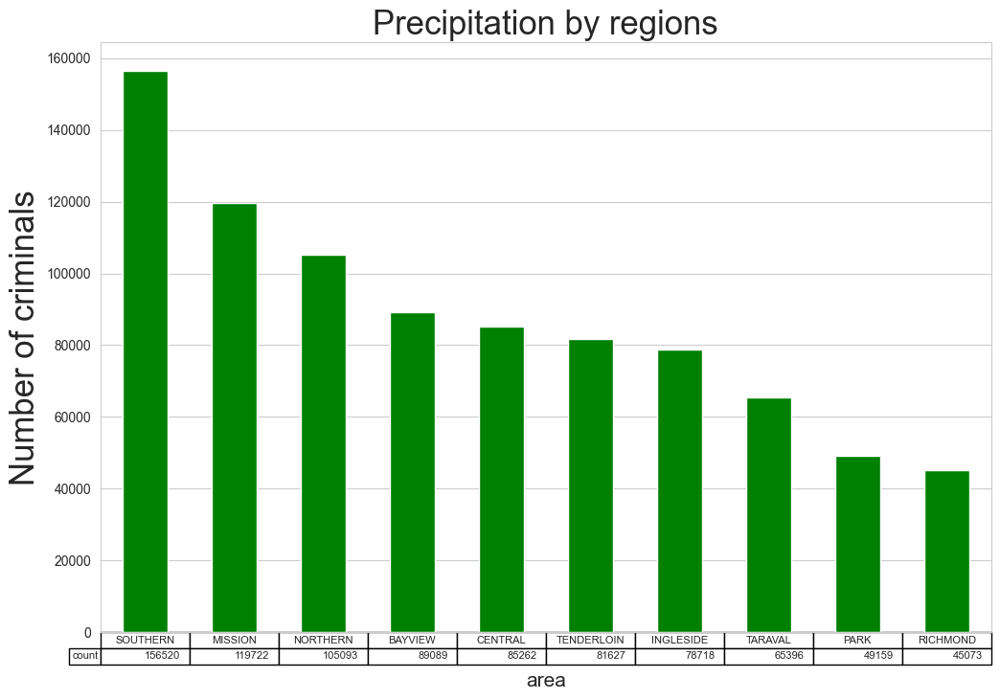

count        10.000000
mean      87565.900000
std       33315.506148
min       45073.000000
25%       68726.500000
50%       83444.500000
75%      101092.000000
max      156520.000000
Name: count, dtype: float64

In [50]:
# Estimate the number of crimes by district

dist = df_train["PdDistrict"].value_counts()
dist.plot(kind="bar",figsize=(12,8), table=True,  color='g')

plt.xticks([])
plt.xlabel('area',fontsize=15,labelpad=30)
plt.ylabel('Number of criminals',fontsize=25)
plt.title('Precipitation by regions',fontsize=25)
plt.show()

dist.describe()

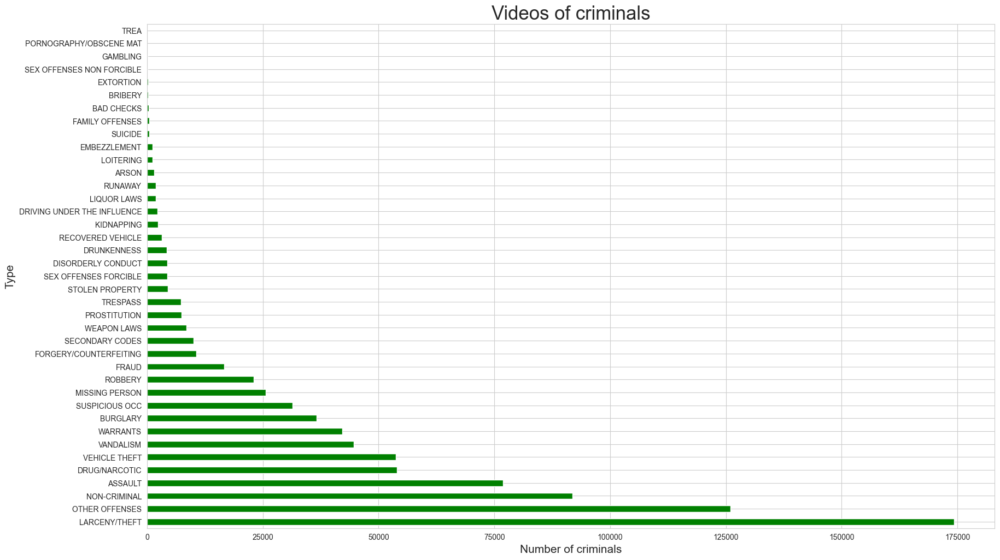

In [51]:
# Let's estimate which crimes most often occur in San Francisco:

kind = df_train['Category'].value_counts()

kind.plot(kind="barh",figsize=(20,12),  color='g')

plt.ylabel('Type',fontsize=15)
plt.xlabel('Number of criminals',fontsize=15)
plt.title('Videos of criminals',fontsize=25)
plt.show()

In [52]:
kind

Category
LARCENY/THEFT                  174305
OTHER OFFENSES                 125943
NON-CRIMINAL                    91911
ASSAULT                         76811
DRUG/NARCOTIC                   53919
VEHICLE THEFT                   53697
VANDALISM                       44580
WARRANTS                        42137
BURGLARY                        36599
SUSPICIOUS OCC                  31392
MISSING PERSON                  25669
ROBBERY                         22987
FRAUD                           16637
FORGERY/COUNTERFEITING          10592
SECONDARY CODES                  9979
WEAPON LAWS                      8550
PROSTITUTION                     7446
TRESPASS                         7317
STOLEN PROPERTY                  4536
SEX OFFENSES FORCIBLE            4379
DISORDERLY CONDUCT               4311
DRUNKENNESS                      4277
RECOVERED VEHICLE                3132
KIDNAPPING                       2340
DRIVING UNDER THE INFLUENCE      2268
LIQUOR LAWS                      1899
RUN

/var/folders/41/nzwfwwtn3kb7y13s4d_whpv00000gn/T/ipykernel_65959/2502779012.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=kind, shade=True, color='g')


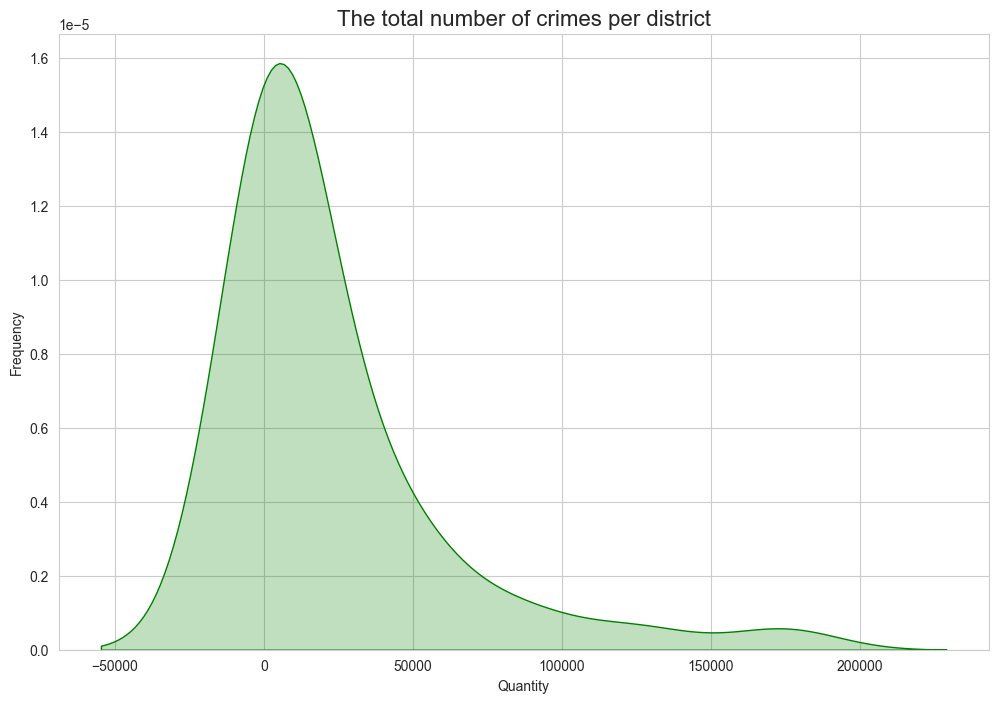

In [53]:
# Let's see how the number of crimes by district looks like on the graph:

plt.figure(figsize=(12, 8))
sns.kdeplot(data=kind, shade=True, color='g')

plt.title('The total number of crimes per district', fontdict={'fontsize': 16})
plt.xlabel('Quantity')
plt.ylabel('Frequency')

plt.show()

In [54]:
df_train

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Date
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015-05-13
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,2015-05-13
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015-05-13
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,2015-05-13
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,2015-05-13
...,...,...,...,...,...,...,...,...,...,...
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-122.459033,37.714056,2003-01-06
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-122.447364,37.731948,2003-01-06
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,-122.403390,37.780266,2003-01-06
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,-122.390531,37.780607,2003-01-06


In [55]:
# Visual breakdown of categories of crimes by their number TOP-10 categories:

import plotly.express as px
cats = df_train["Category"].value_counts()[:10]
# cats['OTHER 29 pos'] = df_train["Category"].value_counts()[11:].sum()
label = cats[0]
cats = pd.DataFrame(cats).reset_index()
print(cats)
# cats.rename(columns={'index': 'Category', 'Category': 'Count'}, inplace=True)
cats.index += 1
label = cats['Category']
fig = px.pie(names=label, values=cats['count'], height=600, color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textposition='inside', textinfo='percent+label', textfont_size=12, )
fig.update_layout(title_text = 'TOP-10 Category of criminals',
                  title_font = dict(size=20, family='Verdana', color='black'))
fig.show()

         Category   count
0   LARCENY/THEFT  174305
1  OTHER OFFENSES  125943
2    NON-CRIMINAL   91911
3         ASSAULT   76811
4   DRUG/NARCOTIC   53919
5   VEHICLE THEFT   53697
6       VANDALISM   44580
7        WARRANTS   42137
8        BURGLARY   36599
9  SUSPICIOUS OCC   31392


In [56]:
df_train['Hour'] = df_train.Dates.dt.hour   # I select the date column from the data
#(initially I had to transfer the data from this column from object to datetime64)

In [57]:
# We can estimate how many crimes happened in certain periods of time, for example from 20 to 23:
df_train.loc[(df_train.Hour >= 20) & (df_train.Hour <= 23)].count()

Dates         176082
Category      176082
Descript      176082
DayOfWeek     176082
PdDistrict    176082
Resolution    176082
Address       176082
X             176082
Y             176082
Date          176082
Hour          176082
dtype: int64

In [58]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 875659 entries, 0 to 878048
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Dates       875659 non-null  datetime64[ns]
 1   Category    875659 non-null  object        
 2   Descript    875659 non-null  object        
 3   DayOfWeek   875659 non-null  object        
 4   PdDistrict  875659 non-null  object        
 5   Resolution  875659 non-null  object        
 6   Address     875659 non-null  object        
 7   X           875659 non-null  float64       
 8   Y           875659 non-null  float64       
 9   Date        875659 non-null  object        
 10  Hour        875659 non-null  int32         
dtypes: datetime64[ns](1), float64(2), int32(1), object(7)
memory usage: 76.8+ MB


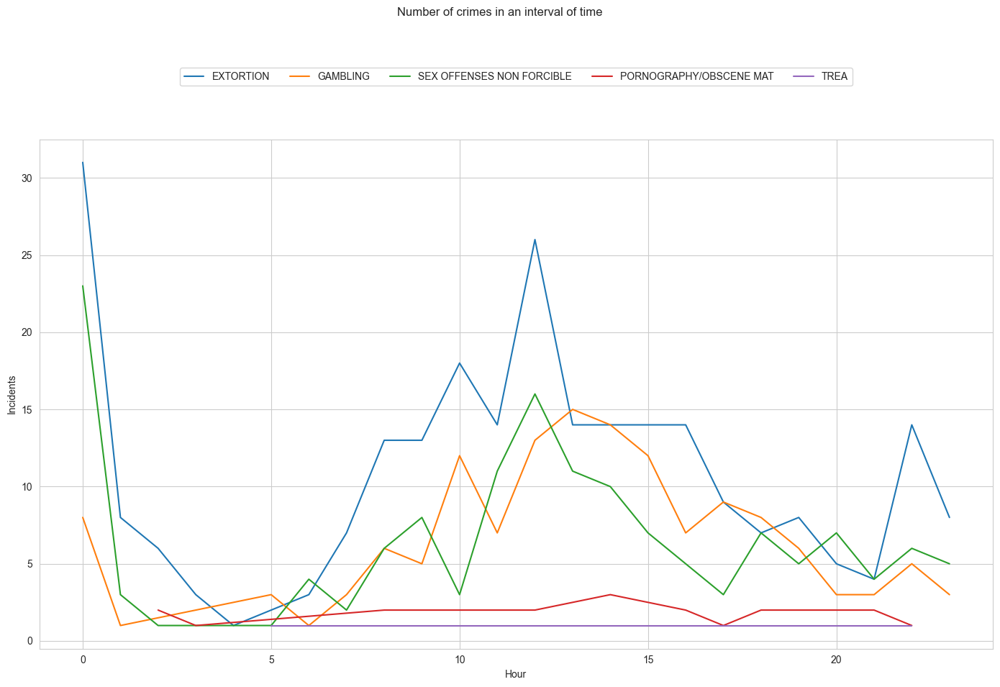

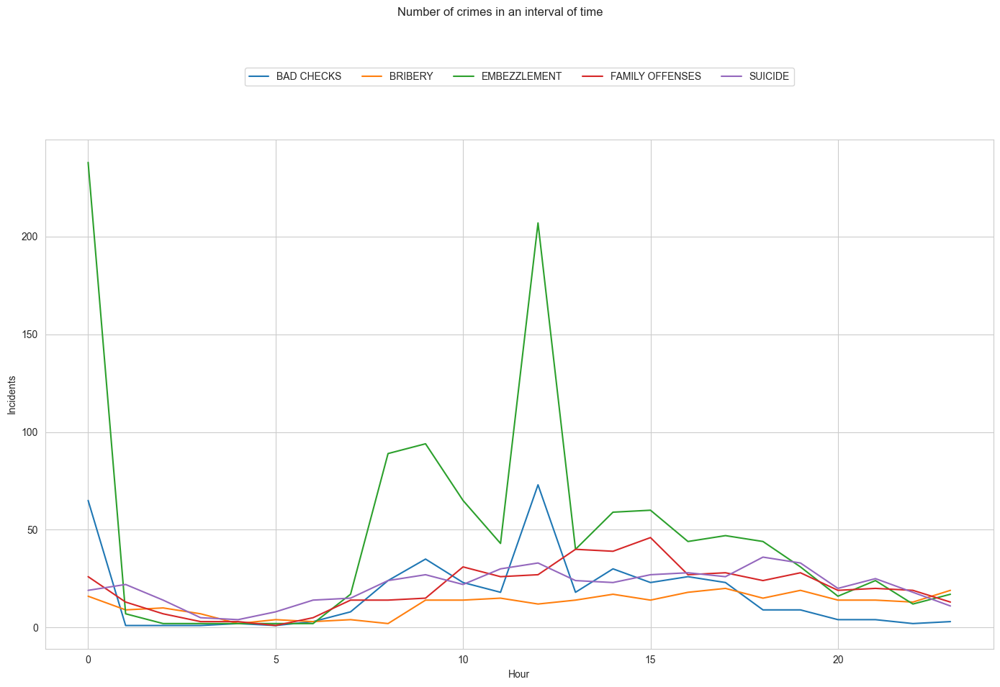

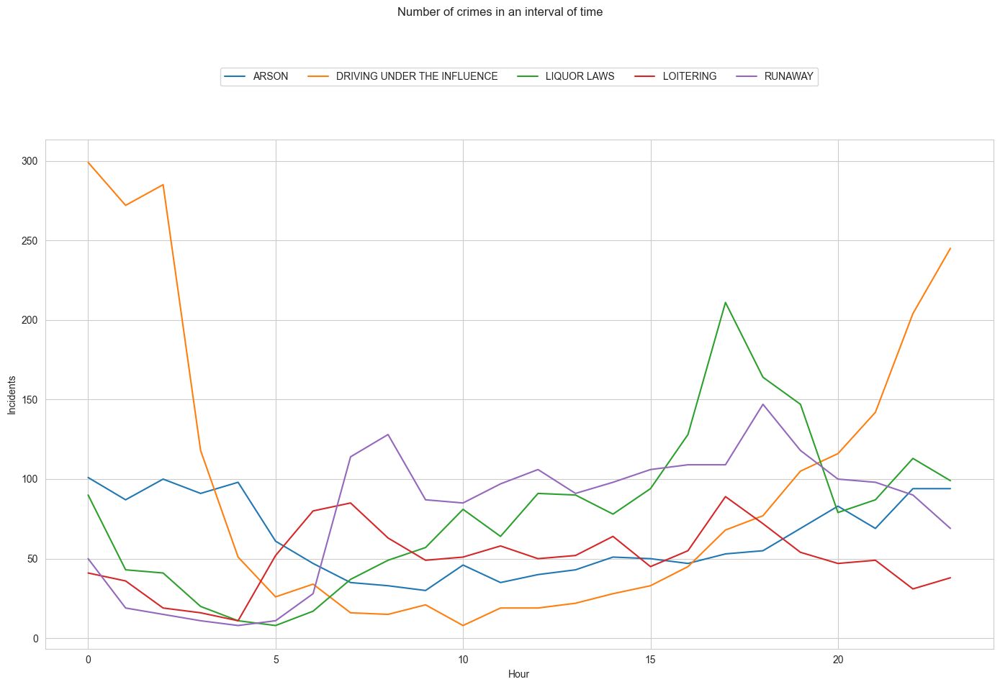

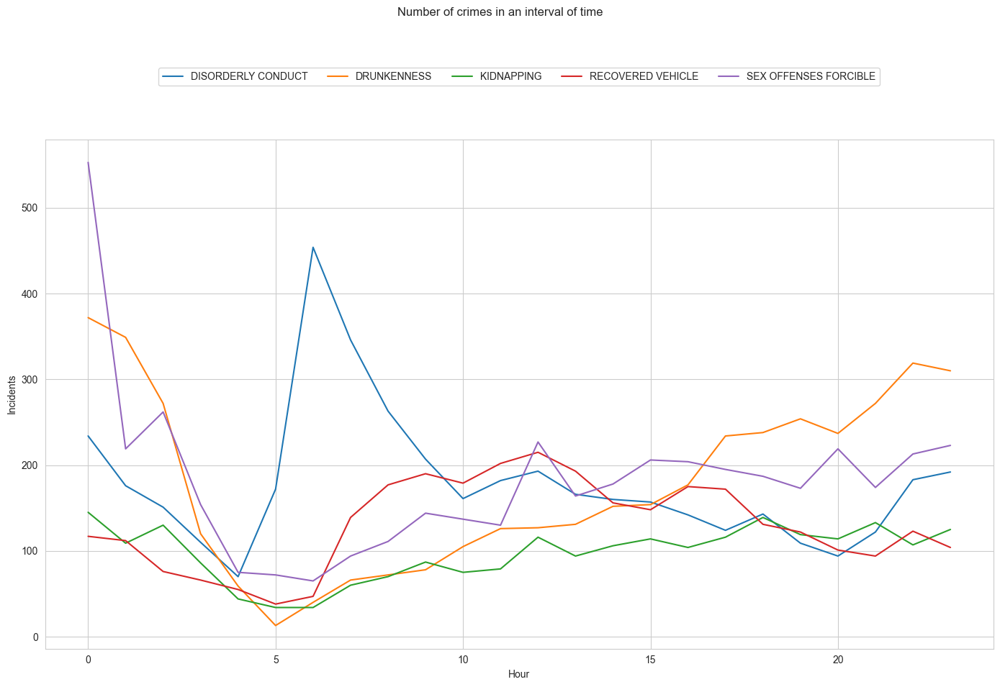

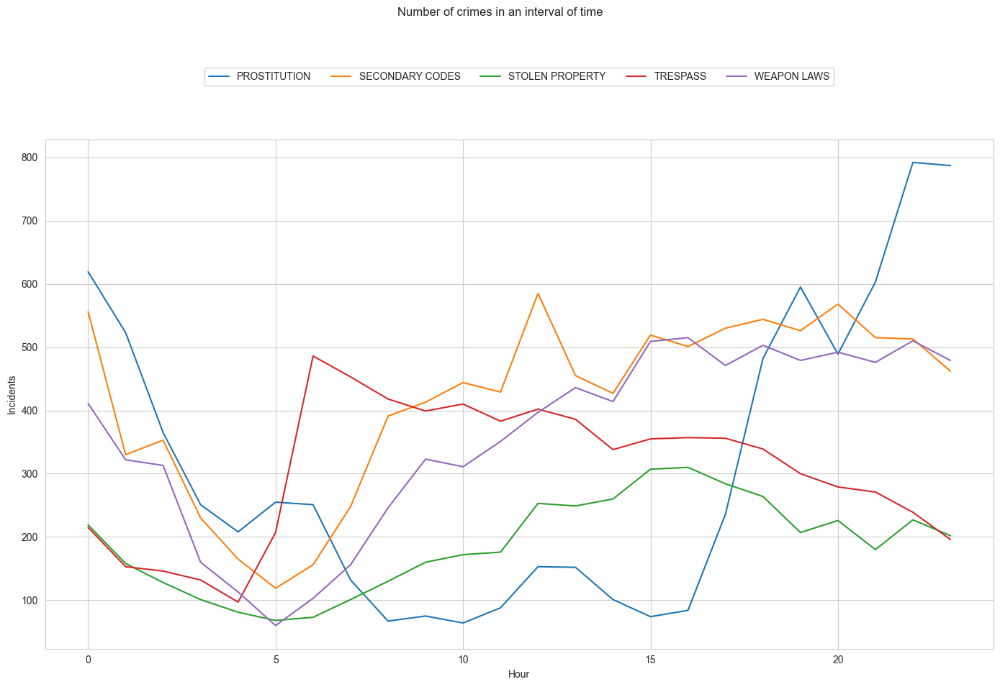

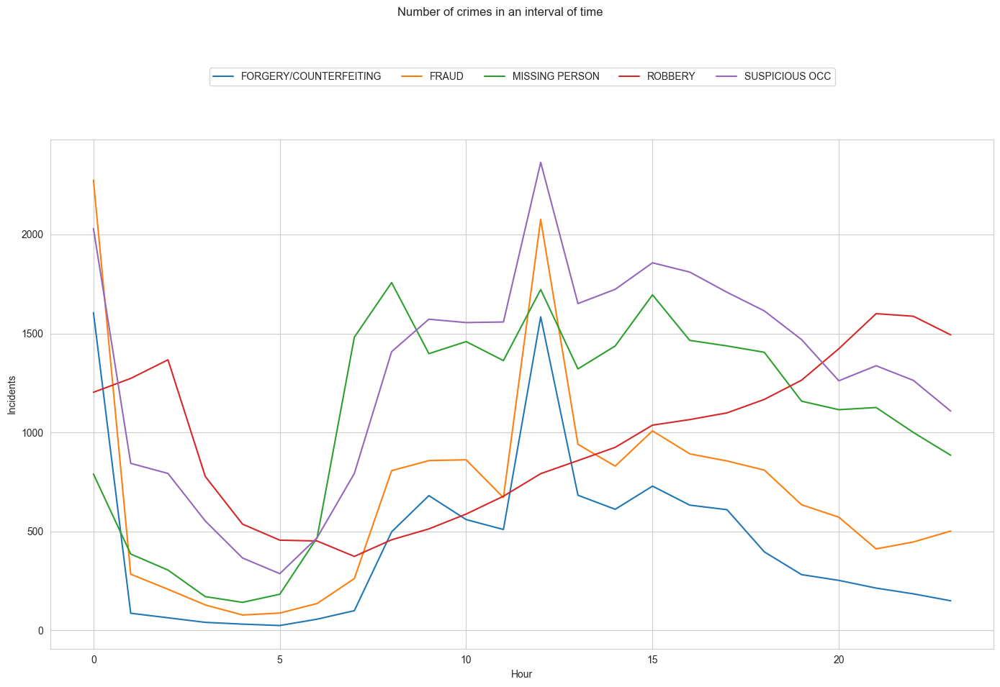

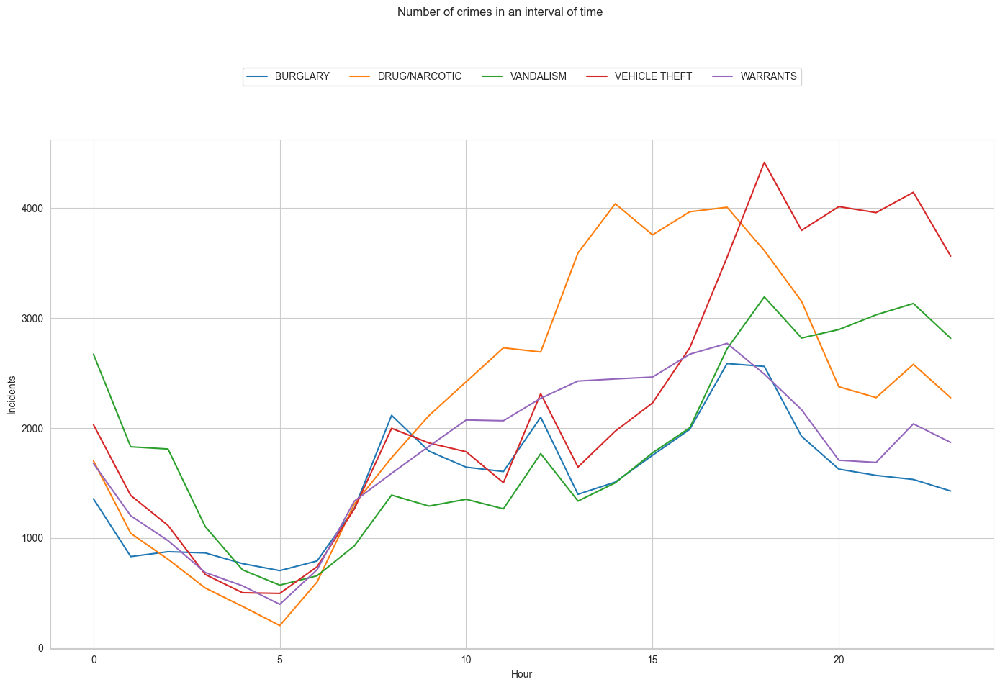

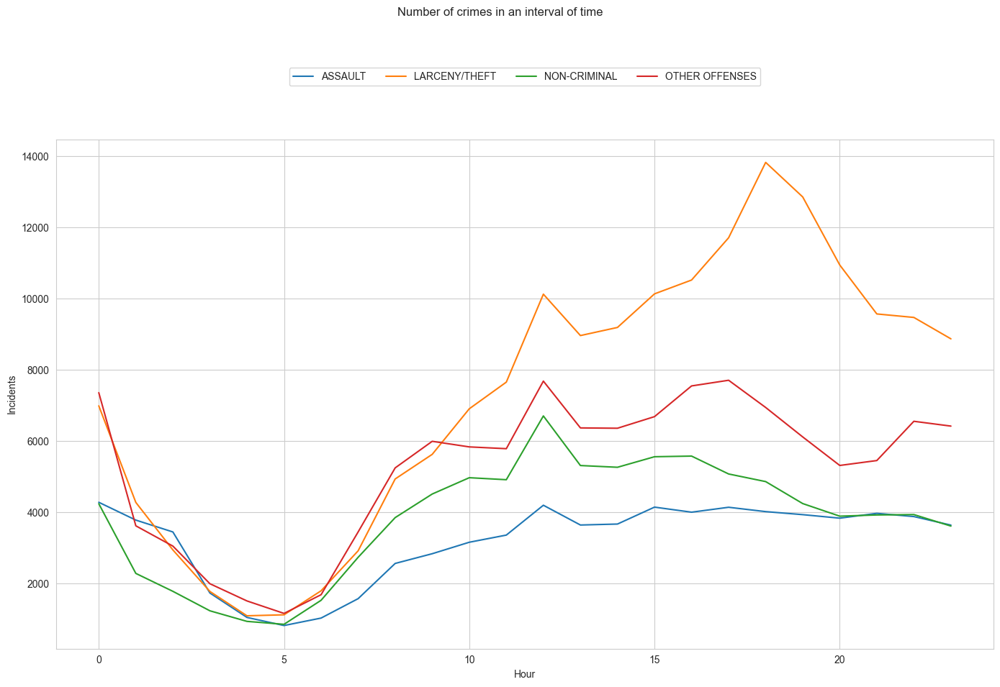

In [59]:
# Let's see how many crimes in different categories occur in different periods of time:
data = df_train.groupby(['Hour', 'Category'],
                     as_index=False).count().iloc[:, :4]
data.rename(columns={'Dates': 'Incidents'}, inplace=True)

unique_cats = list(data.groupby(['Category']).sum().sort_values(['Incidents']).index)
for i in range(0, len(unique_cats), 5):
    sns.set_style("whitegrid")
    fig, ax = plt.subplots(figsize=(14, 10))
    ax = sns.lineplot(x='Hour', y='Incidents', data=data[data['Category'].isin(unique_cats[i: i+5])], hue='Category')
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=6)
    plt.suptitle('Number of crimes in an interval of time')
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [60]:
average_frequency = (df_train.groupby('Category').count())/(df_train.shape[0])
average_frequency.Dates

Category
ARSON                          0.001727
ASSAULT                        0.087718
BAD CHECKS                     0.000464
BRIBERY                        0.000330
BURGLARY                       0.041796
DISORDERLY CONDUCT             0.004923
DRIVING UNDER THE INFLUENCE    0.002590
DRUG/NARCOTIC                  0.061575
DRUNKENNESS                    0.004884
EMBEZZLEMENT                   0.001329
EXTORTION                      0.000292
FAMILY OFFENSES                0.000557
FORGERY/COUNTERFEITING         0.012096
FRAUD                          0.018999
GAMBLING                       0.000167
KIDNAPPING                     0.002672
LARCENY/THEFT                  0.199056
LIQUOR LAWS                    0.002169
LOITERING                      0.001378
MISSING PERSON                 0.029314
NON-CRIMINAL                   0.104962
OTHER OFFENSES                 0.143827
PORNOGRAPHY/OBSCENE MAT        0.000025
PROSTITUTION                   0.008503
RECOVERED VEHICLE              

Done 1
Done 2
Done 3
Done 4
Done 5
Done 6
Done 7


Text(0.5, 1.0, 'Transmigration to San Francisco')

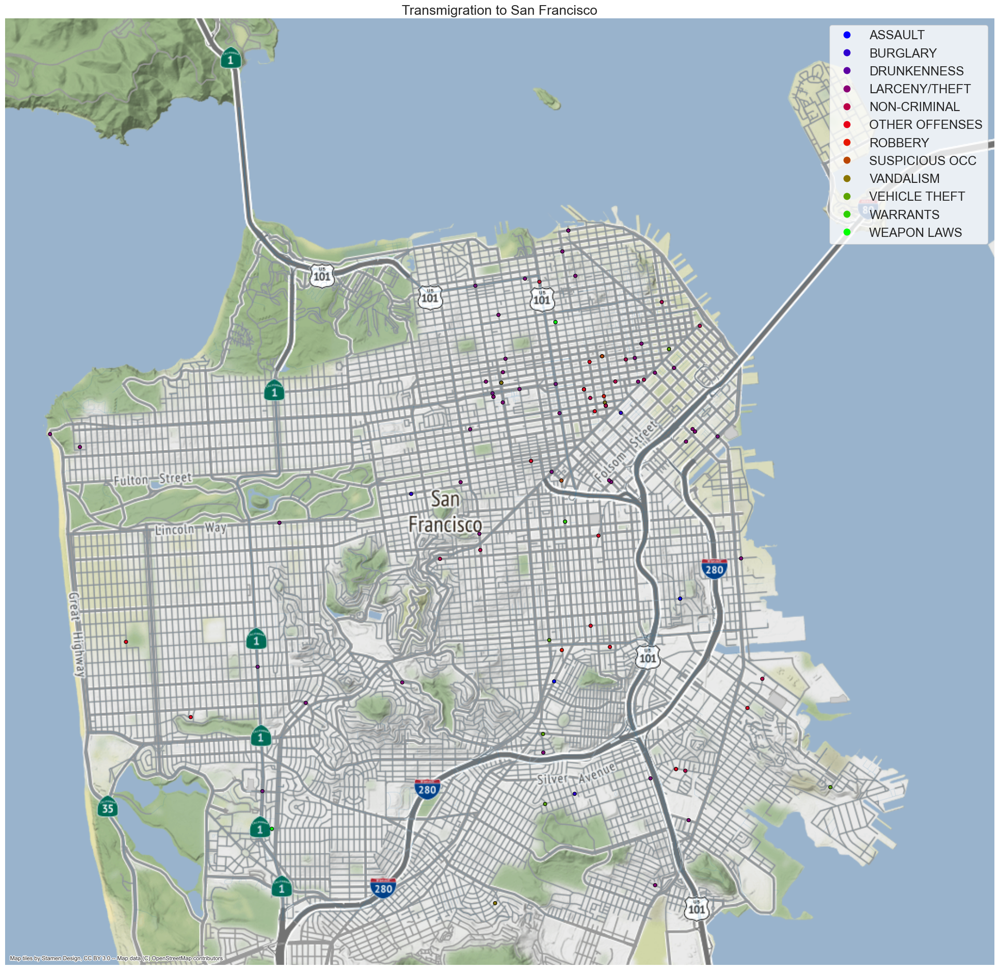

: 

In [61]:
import contextily as ctx

# Add coordinates to the main file:

geometry2 = [Point(xy) for xy in zip(df_train['X'], df_train['Y'])]

print("Done 1")

# Convert shapefile to GeoDataFrame

geo_df = gpd.read_file('../data/tl_2017_06075_roads/tl_2017_06075_roads.shp')
geo_df = geo_df.to_crs(epsg=3857)

print("Done 2")

# Convert Pandas DataFrame to GeoDataFrame

crime_geo_df = gpd.GeoDataFrame(df_train, geometry=geometry2)

print("Done 3")

# Initialize the crs coordinate system to 4326, projection onto the ellipsoid,
# because in this format data is presented in geometry

crime_geo_df.crs = "EPSG:4326"

# Change crs to Mercator to match coordinate encoding
#San Francisco GeoDataFrame

crime_geo_df = crime_geo_df.to_crs(epsg = 3857)

print("Done 4")

# Map output optimization setting

sns.set_context("paper", font_scale=2)

print("Done 5")

# Create a map

fig, ax = plt.subplots(figsize=(20,20))

# Apply our SF GeoDataFrame layer

geo_df.plot(ax=ax, alpha = .1)

# Draw points of crimes

print("Done 6")

crime_geo_df.plot(ax=ax, column = 'Category', cmap = 'brg', marker = '.', \
                  markersize=100, edgecolor = 'black', alpha=1, legend = True)

print("Done 7")
# Add terrain and features to the map using contextily

ctx.add_basemap(ax, )

# Disable axes with coordinates in Mercator format
# (projected onto a cylinder, axis = earth axis)

ax.set_axis_off()

fig.tight_layout()
plt.title("Transmigration to San Francisco")
# plt.savefig('SF_crime_areas.png');

In [1]:
plt.savefig('SF_crime_areas.png')

NameError: name 'plt' is not defined